In [ ]:
import torch
import cv2
from google.colab.patches import cv2_imshow

In [ ]:
model = torch.hub.load('ultralytics/yolov5', 'yolov5s')

Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2025-2-13 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
Adding AutoShape... 


In [ ]:
object_names = model.module.names if hasattr(model, 'module') else model.names

In [ ]:
image = cv2.imread('/content/photo-1552728089-57bdde30beb3.jpg')
results = model(image)

/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:894: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


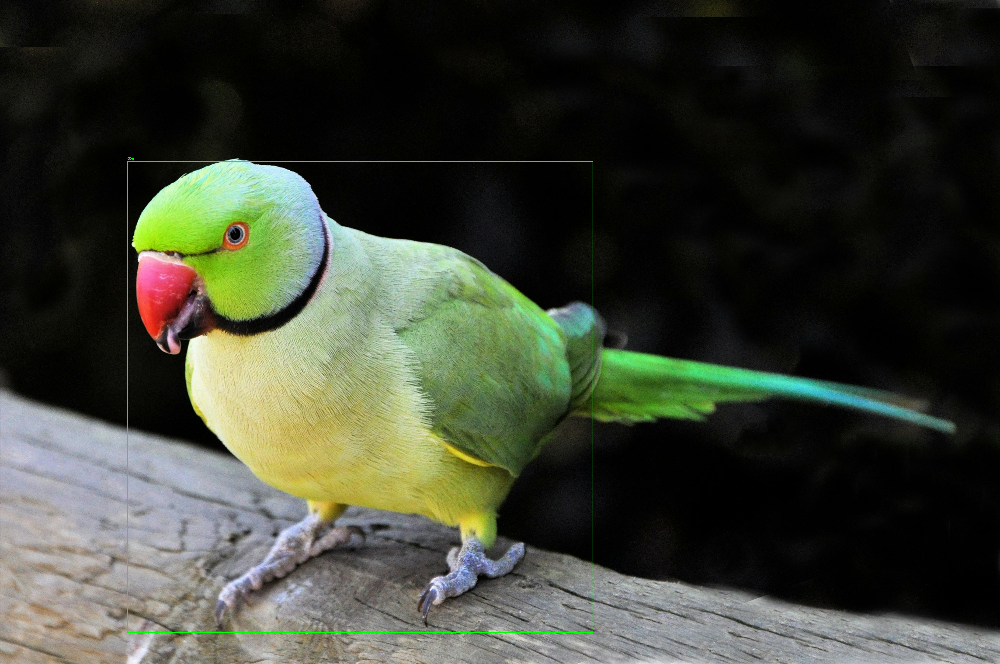

In [ ]:
for detection in results.xyxy[0]:
  xmin, ymin, xmax, ymax = detection[0], detection[1], detection[2], detection[3]
  class_index = int(detection[5])
  class_name = object_names[class_index]
  # Convert tensor values to integers
  xmin, ymin, xmax, ymax = int(xmin.item()), int(ymin.item()), int(xmax.item()), int(ymax.item())
  cv2.rectangle(image, (xmin, ymin), (xmax, ymax), (0, 255, 0), 2)
  cv2.putText(image, class_name, (xmin, ymin - 10),
  cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)
  # Display the image with bounding boxes and class names
  cv2_imshow(image)
  # cv2.waitKey(0)
  # cv2.destroyAllWindows()